<a href="https://colab.research.google.com/github/NihalShriv/ML-Libs-Learning/blob/master/Projects/SF%20Crime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"

In [3]:
!kaggle competitions download -c sf-crime

 50% 11.0M/22.1M [00:00<00:00, 110MB/s]
100% 22.1M/22.1M [00:00<00:00, 108MB/s]
  0% 0.00/2.35M [00:00<?, ?B/s]
100% 2.35M/2.35M [00:00<00:00, 77.5MB/s]
 75% 14.0M/18.7M [00:00<00:00, 142MB/s]
100% 18.7M/18.7M [00:00<00:00, 113MB/s]


In [4]:
!unzip \*.zip  && rm *.zip

Archive:  test.csv.zip
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n

Archive:  train.csv.zip
replace train.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n

Archive:  sampleSubmission.csv.zip
replace sampleSubmission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n

3 archives were successfully processed.


In [5]:
import pandas as pd
import numpy as np

In [6]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
smp = pd.read_csv('sampleSubmission.csv')

**Data Exploration**

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   Descript    878049 non-null  object 
 3   DayOfWeek   878049 non-null  object 
 4   PdDistrict  878049 non-null  object 
 5   Resolution  878049 non-null  object 
 6   Address     878049 non-null  object 
 7   X           878049 non-null  float64
 8   Y           878049 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884262 entries, 0 to 884261
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Id          884262 non-null  int64  
 1   Dates       884262 non-null  object 
 2   DayOfWeek   884262 non-null  object 
 3   PdDistrict  884262 non-null  object 
 4   Address     884262 non-null  object 
 5   X           884262 non-null  float64
 6   Y           884262 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 47.2+ MB


In [9]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [10]:
test.Id.value_counts()

2047      1
850122    1
846024    1
823495    1
825542    1
         ..
689146    1
695289    1
693240    1
715767    1
0         1
Name: Id, Length: 884262, dtype: int64

In [11]:
id = test.Id
test.drop(['Id'], axis=1, inplace=True)

In [12]:
test.head()

,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [13]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884262 entries, 0 to 884261
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       884262 non-null  object 
 1   DayOfWeek   884262 non-null  object 
 2   PdDistrict  884262 non-null  object 
 3   Address     884262 non-null  object 
 4   X           884262 non-null  float64
 5   Y           884262 non-null  float64
dtypes: float64(2), object(4)
memory usage: 40.5+ MB


In [14]:
smp.head()

,Id,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,EXTORTION,FAMILY OFFENSES,FORGERY/COUNTERFEITING,FRAUD,GAMBLING,KIDNAPPING,LARCENY/THEFT,LIQUOR LAWS,LOITERING,MISSING PERSON,NON-CRIMINAL,OTHER OFFENSES,PORNOGRAPHY/OBSCENE MAT,PROSTITUTION,RECOVERED VEHICLE,ROBBERY,RUNAWAY,SECONDARY CODES,SEX OFFENSES FORCIBLE,SEX OFFENSES NON FORCIBLE,STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [15]:
train.Category.value_counts()

LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQUOR LAWS 

In [16]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [17]:
train.DayOfWeek.value_counts()

Friday       133734
Wednesday    129211
Saturday     126810
Thursday     125038
Tuesday      124965
Monday       121584
Sunday       116707
Name: DayOfWeek, dtype: int64

In [18]:
train.PdDistrict.value_counts()

SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
Name: PdDistrict, dtype: int64

In [19]:
train.groupby(['DayOfWeek', 'PdDistrict']).count()

Dates  Category  Descript  ...  Address      X      Y
DayOfWeek PdDistrict                             ...                       
Friday    BAYVIEW     13681     13681     13681  ...    13681  13681  13681
          CENTRAL     13397     13397     13397  ...    13397  13397  13397
          INGLESIDE   11881     11881     11881  ...    11881  11881  11881
          MISSION     18190     18190     18190  ...    18190  18190  18190
          NORTHERN    16331     16331     16331  ...    16331  16331  16331
...                     ...       ...       ...  ...      ...    ...    ...
Wednesday PARK         7281      7281      7281  ...     7281   7281   7281
          RICHMOND     6513      6513      6513  ...     6513   6513   6513
          SOUTHERN    22913     22913     22913  ...    22913  22913  22913
          TARAVAL      9802      9802      9802  ...     9802   9802   9802
          TENDERLOIN  12860     12860     12860  ...    12860  12860  12860

[70 rows x 7 columns]

In [20]:
train.groupby(['PdDistrict', 'DayOfWeek']).count()

Dates  Category  Descript  ...  Address      X      Y
PdDistrict DayOfWeek                             ...                       
BAYVIEW    Friday     13681     13681     13681  ...    13681  13681  13681
           Monday     12649     12649     12649  ...    12649  12649  12649
           Saturday   12440     12440     12440  ...    12440  12440  12440
           Sunday     11965     11965     11965  ...    11965  11965  11965
           Thursday   12406     12406     12406  ...    12406  12406  12406
...                     ...       ...       ...  ...      ...    ...    ...
TENDERLOIN Saturday   11110     11110     11110  ...    11110  11110  11110
           Sunday     10178     10178     10178  ...    10178  10178  10178
           Thursday   12136     12136     12136  ...    12136  12136  12136
           Tuesday    12498     12498     12498  ...    12498  12498  12498
           Wednesday  12860     12860     12860  ...    12860  12860  12860

[70 rows x 7 columns]

In [21]:
train['Dates'].value_counts(ascending=True)

2014-06-29 16:35:00      1
2012-10-06 22:10:00      1
2007-11-01 08:40:00      1
2003-04-29 22:35:00      1
2005-05-22 14:28:00      1
                      ... 
2007-06-01 00:01:00     61
2006-01-01 12:00:00     63
2012-01-01 00:01:00     94
2006-01-01 00:01:00    136
2011-01-01 00:01:00    185
Name: Dates, Length: 389257, dtype: int64

In [22]:
type(train.Dates)

pandas.core.series.Series

In [23]:
print(train.Descript.value_counts())

GRAND THEFT FROM LOCKED AUTO                       60022
LOST PROPERTY                                      31729
BATTERY                                            27441
STOLEN AUTOMOBILE                                  26897
DRIVERS LICENSE, SUSPENDED OR REVOKED              26839
                                                   ...  
BURGLARY,WAREHOUSE UNDER CONSTRT, ATT. FORCIBLE        1
ATTEMPTED THEFT PHONE BOOTH                            1
AGGRAVATED ASSAULT OF POLICE OFFICER, SNIPING          1
DESTRUCTIVE DEVICE, POSSESSION OF MATERIALS            1
ROBBERY,  ATM, GUN, ATT.                               1
Name: Descript, Length: 879, dtype: int64


**Data Visualization**

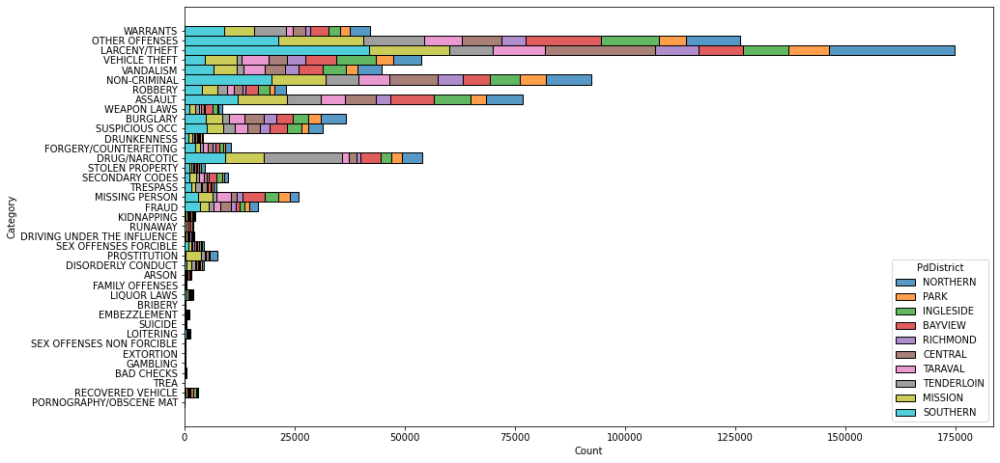

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,8))
sns.histplot(data=train, y='Category', hue='PdDistrict', multiple='stack', )
plt.show()

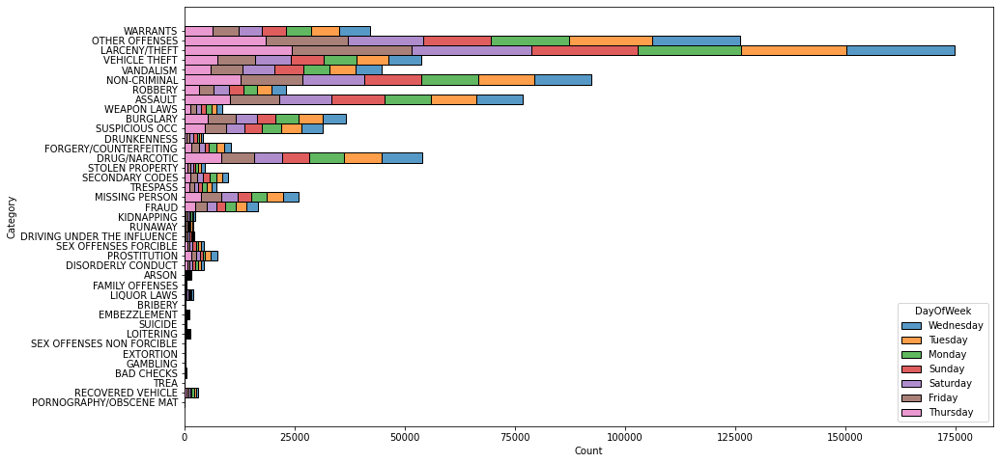

In [25]:
plt.figure(figsize=(15,8))
sns.histplot(data=train, y='Category', hue='DayOfWeek', multiple='stack')
plt.show()

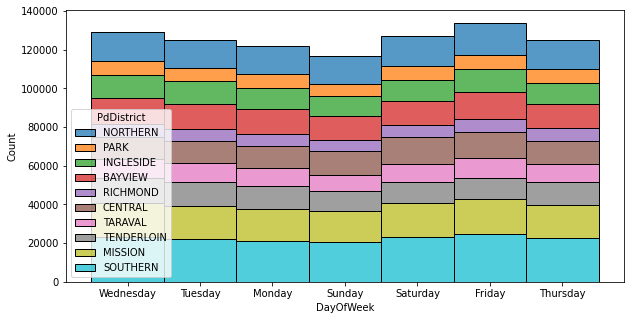

In [26]:
plt.figure(figsize=(10,5))
sns.histplot(data=train, x='DayOfWeek', hue='PdDistrict', multiple='stack')
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [27]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [28]:
type(train['Dates'][0])

str

In [29]:
len(train.Dates)

878049

In [30]:
type(train.iloc[0,0])

str

In [31]:
train.iloc[1,0][:10]

'2015-05-13'

In [32]:
train["Dates"] = pd.to_datetime(train["Dates"])
train["YEAR"] = train["Dates"].dt.year
train["MONTH"] = train["Dates"].dt.month
train["DAY"] = train["Dates"].dt.day
train["HOUR"] = train["Dates"].dt.hour

test["Dates"] = pd.to_datetime(test["Dates"])
test["YEAR"] = test["Dates"].dt.year
test["MONTH"] = test["Dates"].dt.month
test["DAY"] = test["Dates"].dt.day
test["HOUR"] = test["Dates"].dt.hour

In [33]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,YEAR,MONTH,DAY,HOUR
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,23
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,23
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,23


In [34]:
train = train.astype({'Category' : 'category', 'DayOfWeek' : 'string', 'PdDistrict': 'string', 'Resolution' : 'string', 'Address' : 'string'})
train.dtypes

Dates         datetime64[ns]
Category            category
Descript              object
DayOfWeek             string
PdDistrict            string
Resolution            string
Address               string
X                    float64
Y                    float64
YEAR                   int64
MONTH                  int64
DAY                    int64
HOUR                   int64
dtype: object

In [35]:
test = test.astype({'DayOfWeek' : 'string', 'PdDistrict': 'string', 'Address' : 'string'})

In [36]:
train.describe()

,X,Y,YEAR,MONTH,DAY,HOUR
count,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000
mean,-122.422616,37.771020,2008.712046,6.436509,15.570623,13.412655
std,0.030354,0.456893,3.631194,3.428972,8.783005,6.549573
min,-122.513642,37.707879,2003.000000,1.000000,1.000000,0.000000
25%,-122.432952,37.752427,2006.000000,3.000000,8.000000,9.000000
50%,-122.416420,37.775421,2009.000000,6.000000,16.000000,14.000000
75%,-122.406959,37.784369,2012.000000,9.000000,23.000000,19.000000
max,-120.500000,90.000000,2015.000000,12.000000,31.000000,23.000000


In [37]:
from numpy import percentile
q25, q75 = percentile(train.Y, 25), percentile(train.Y, 75)
iqr = q75 - q25
print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
# calculate the outlier cutoff
cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off
# identify outliers
outliers = [x for x in train.Y if x < lower or x > upper]
print('Identified outliers: %d' % len(outliers))

Percentiles: 25th=37.752, 75th=37.784, IQR=0.032
Identified outliers: 67


In [38]:
train.loc[train['Y'] == 90].Category.unique()

['LARCENY/THEFT', 'ASSAULT', 'NON-CRIMINAL', 'OTHER OFFENSES', 'TRESPASS', ..., 'BURGLARY', 'DISORDERLY CONDUCT', 'STOLEN PROPERTY', 'SEX OFFENSES FORCIBLE', 'ROBBERY']
Length: 14
Categories (14, object): ['LARCENY/THEFT', 'ASSAULT', 'NON-CRIMINAL', 'OTHER OFFENSES', ...,
                          'DISORDERLY CONDUCT', 'STOLEN PROPERTY', 'SEX OFFENSES FORCIBLE', 'ROBBERY']

In [39]:
train.loc[train['Y'] == 90].PdDistrict.unique()

<StringArray>
['TENDERLOIN',    'BAYVIEW',    'CENTRAL',   'RICHMOND',    'TARAVAL',
   'SOUTHERN',       'PARK',  'INGLESIDE',   'NORTHERN',    'MISSION']
Length: 10, dtype: string

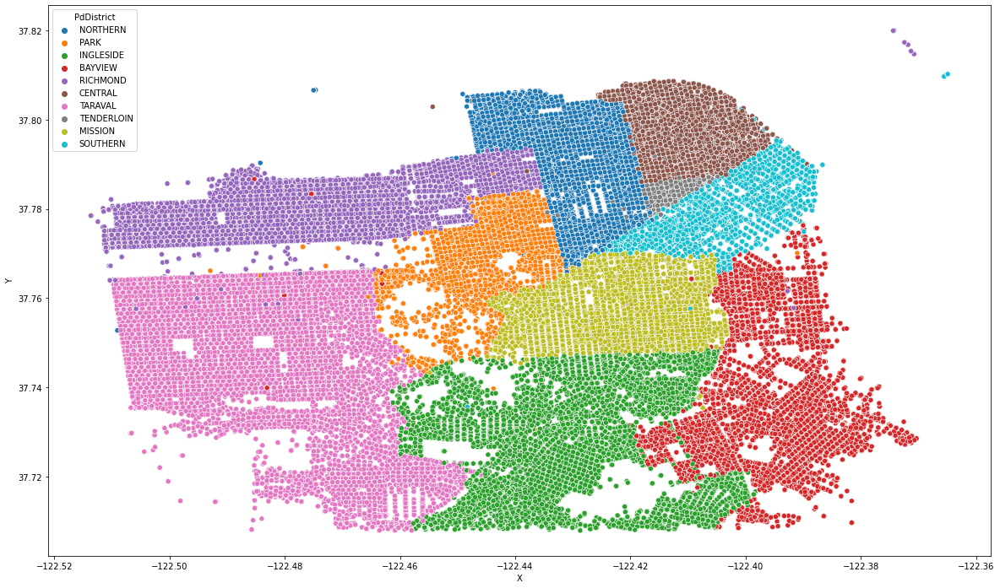

In [40]:
plt.figure(figsize=(20,12))

sns.scatterplot(x='X', y='Y', data=train.iloc[train[train['Y'] != 90].index, :], hue='PdDistrict')
plt.show()

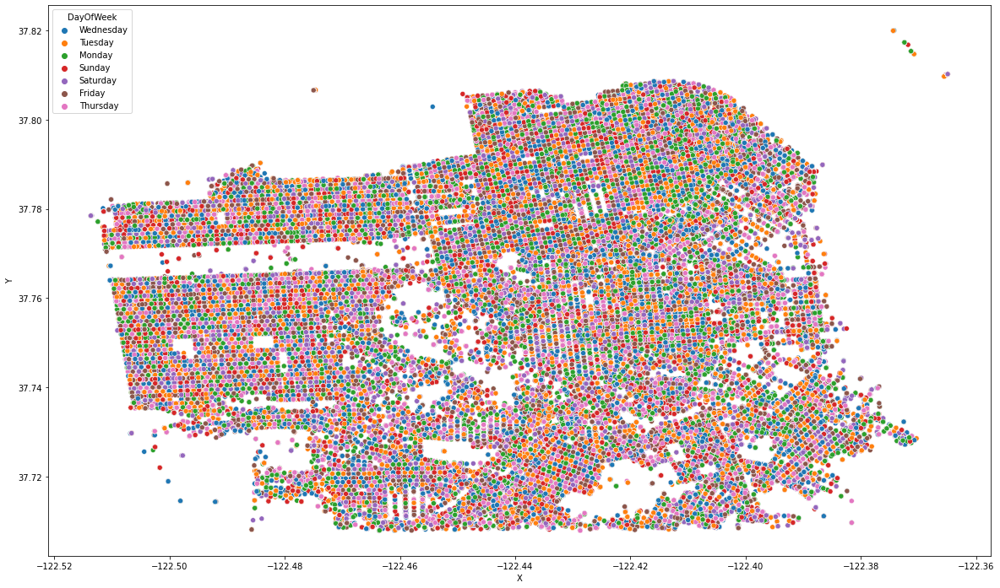

In [41]:
plt.figure(figsize=(20,12))

sns.scatterplot(x='X', y='Y', data=train.iloc[train[train['Y'] != 90].index, :], hue='DayOfWeek')
plt.show()

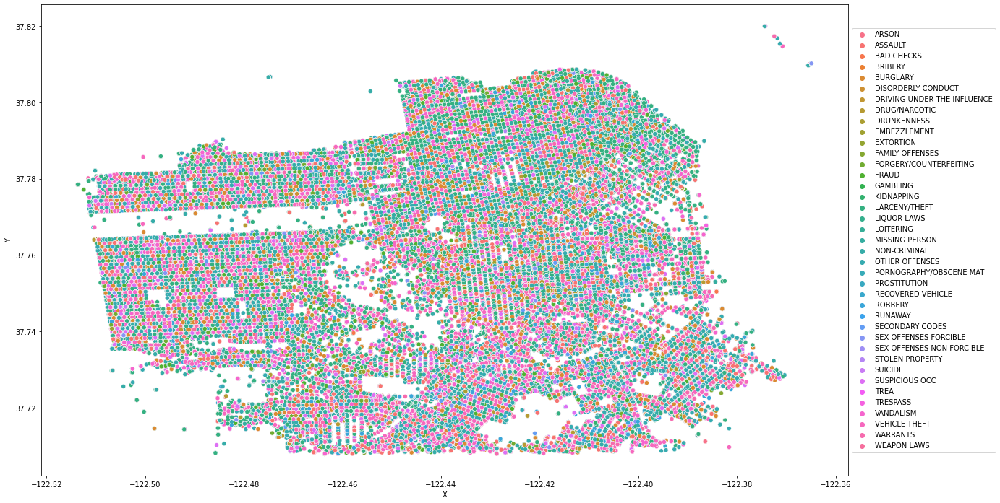

In [42]:
plt.figure(figsize=(20,12))

sns.scatterplot(x='X', y='Y', data=train.iloc[train[train['Y'] != 90].index, :], hue='Category')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [43]:
train.Resolution.value_counts()

NONE                                      526790
ARREST, BOOKED                            206403
ARREST, CITED                              77004
LOCATED                                    17101
PSYCHOPATHIC CASE                          14534
UNFOUNDED                                   9585
JUVENILE BOOKED                             5564
COMPLAINANT REFUSES TO PROSECUTE            3976
DISTRICT ATTORNEY REFUSES TO PROSECUTE      3934
NOT PROSECUTED                              3714
JUVENILE CITED                              3332
PROSECUTED BY OUTSIDE AGENCY                2504
EXCEPTIONAL CLEARANCE                       1530
JUVENILE ADMONISHED                         1455
JUVENILE DIVERTED                            355
CLEARED-CONTACT JUVENILE FOR MORE INFO       217
PROSECUTED FOR LESSER OFFENSE                 51
Name: Resolution, dtype: Int64

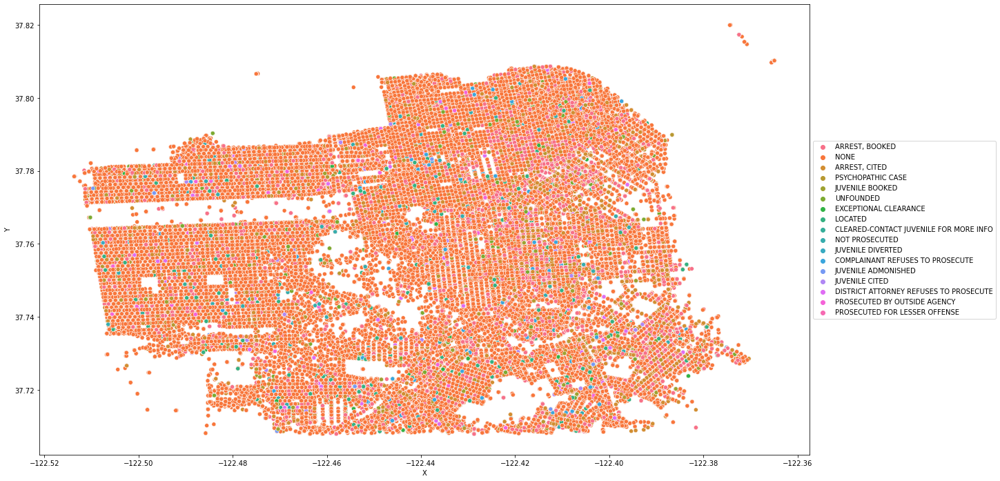

In [44]:
plt.figure(figsize=(20,12))

sns.scatterplot(x='X', y='Y', data=train.iloc[train[train['Y'] != 90].index, :], hue='Resolution')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

<Figure size 1440x864 with 0 Axes>

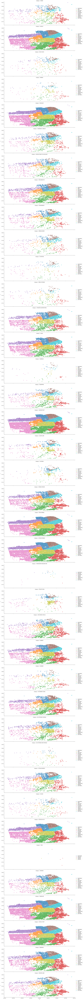

In [45]:
plt.figure(figsize=(20,12))

g = sns.FacetGrid(train.iloc[train[train['Y'] != 90].index, :], row='Category', hue='PdDistrict', aspect=3, height=5)
g.map(sns.scatterplot, 'X', 'Y')
for ax in g.axes.ravel():
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [46]:
train.head(1)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,YEAR,MONTH,DAY,HOUR
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,23


**Model Preparation**

In [47]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
num_train = train.copy()

num_train.drop(num_train[num_train['Y'] == 90].index, inplace=True)
num_train.drop(['Descript', 'Resolution', 'Address', 'Dates'], axis=1, inplace=True)

num_train['Category'] = le.fit_transform(num_train['Category'])
num_train['DayOfWeek'] = le.fit_transform(num_train['DayOfWeek'])
num_train['PdDistrict'] = le.fit_transform(num_train['PdDistrict'])
num_train.head()

,Category,DayOfWeek,PdDistrict,X,Y,YEAR,MONTH,DAY,HOUR
0,37,6,4,-122.425892,37.774599,2015,5,13,23
1,21,6,4,-122.425892,37.774599,2015,5,13,23
2,21,6,4,-122.424363,37.800414,2015,5,13,23
3,16,6,4,-122.426995,37.800873,2015,5,13,23
4,16,6,5,-122.438738,37.771541,2015,5,13,23


In [48]:
test['DayOfWeek'] = le.fit_transform(test['DayOfWeek'])
test['PdDistrict'] = le.fit_transform(test['PdDistrict'])
test.drop(['Dates', 'Address'], axis=1, inplace=True)

test.head()

,DayOfWeek,PdDistrict,X,Y,YEAR,MONTH,DAY,HOUR
0,3,0,-122.399588,37.735051,2015,5,10,23
1,3,0,-122.391523,37.732432,2015,5,10,23
2,3,4,-122.426002,37.792212,2015,5,10,23
3,3,2,-122.437394,37.721412,2015,5,10,23
4,3,2,-122.437394,37.721412,2015,5,10,23


In [49]:
train.isnull().values.any()

False

In [50]:
num_train.isnull().values.any()

False

In [51]:
num_train.Category.unique()

array([37, 21, 16, 36, 35, 20, 25,  1, 38,  4, 32,  8, 12,  7, 30, 27, 34,
       19, 13, 15, 26,  6, 28, 23,  5,  0, 11, 17,  3,  9, 31, 18, 29, 10,
       14,  2, 33, 24, 22])

In [52]:
# checking which number is assigned to which string.  used "temp" because in num_train, inverse_transform was not possible
# due to multiple columns tranforming into numbers which confused the method on which column should it focus

temp = train.Category
temp = le.fit_transform(temp)

df = pd.DataFrame()
df['numbers'] = np.unique(temp)
df['strings'] = np.unique(le.inverse_transform(temp))
print(df[df['numbers'].isin(['7','16','21','36'])])

    numbers         strings
7         7   DRUG/NARCOTIC
16       16   LARCENY/THEFT
21       21  OTHER OFFENSES
36       36   VEHICLE THEFT


In [53]:
train_target = num_train['Category']
num_train.drop('Category', axis=1, inplace=True)

train_target.head()

0    37
1    21
2    21
3    16
4    16
Name: Category, dtype: int64

In [54]:
train_target.unique()

array([37, 21, 16, 36, 35, 20, 25,  1, 38,  4, 32,  8, 12,  7, 30, 27, 34,
       19, 13, 15, 26,  6, 28, 23,  5,  0, 11, 17,  3,  9, 31, 18, 29, 10,
       14,  2, 33, 24, 22])

In [55]:
train_target.describe()

count    877982.000000
mean         19.338419
std          10.688608
min           0.000000
25%          16.000000
50%          20.000000
75%          25.000000
max          38.000000
Name: Category, dtype: float64

**Validation Split** for checking accuracy on different parameters and models

In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(num_train, train_target, test_size=0.2, random_state=42)

In [57]:
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.metrics import log_loss
#i = 1

#while i<=19:
#  model = RandomForestClassifier(max_depth=i, random_state=0)
#  model.fit(X_train, y_train)
#  p = model.predict_proba(X_test)
#  print('Tree depth:',i,'   Log Loss:',log_loss(y_test, p))
#  i += 3
#del p

**Model Training**

In [73]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(max_depth=16, random_state=0)
clf.fit(num_train, train_target)
y_pred = clf.predict_proba(test)

*predict()* method segregates the entries(rows) into a class(either this or that) which works in datasets where prediction variable has less options like in iris, only 3 options(setosa, virginica, versicolor) or in titanic, only 2 options(survived or not) **but** in datasets like this where prediciton variable has so many options, *predict_proba()* works which gives probabilities(0.4 chance it is of this class, 0.3 it is of that class, so on)

In [74]:
type(y_pred)

numpy.ndarray

In [75]:
y_pred.shape

(884262, 39)

In [76]:
y_pred[:5]

array([[3.46175137e-03, 1.06874740e-01, 8.95223432e-05, 7.15768475e-04,
        2.53009763e-02, 1.54155282e-03, 5.69699026e-03, 2.94009284e-02,
        2.45832730e-03, 6.53585517e-04, 1.79324418e-04, 5.37143919e-04,
        2.22853585e-03, 7.13704134e-03, 9.98175725e-05, 3.89348422e-03,
        1.28096532e-01, 5.76326873e-04, 1.58189539e-04, 6.93858160e-02,
        7.59629685e-02, 1.82872541e-01, 0.00000000e+00, 4.26291735e-04,
        5.02793938e-03, 3.91584985e-02, 3.17185960e-03, 1.93894682e-02,
        3.57230585e-03, 1.33565862e-04, 5.86800996e-03, 5.49078881e-04,
        4.19653300e-02, 0.00000000e+00, 4.08197616e-03, 6.75959303e-02,
        1.06064904e-01, 3.46226928e-02, 2.10502836e-02],
       [4.00977801e-03, 1.21249992e-01, 2.80979402e-05, 1.15664619e-03,
        2.23530932e-02, 1.73128929e-03, 3.84324886e-03, 5.78880036e-02,
        6.18100639e-03, 7.08501001e-04, 1.64862937e-04, 1.36599341e-04,
        2.61878926e-03, 4.34037208e-03, 6.30648108e-04, 3.59521346e-03,
       

In [77]:
y_pred = pd.DataFrame(y_pred)

In [78]:
y_pred.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38
0,0.003462,0.106875,0.000090,0.000716,0.025301,0.001542,0.005697,0.029401,0.002458,0.000654,0.000179,0.000537,0.002229,0.007137,0.000100,0.003893,0.128097,0.000576,0.000158,0.069386,0.075963,0.182873,0.0,0.000426,0.005028,0.039158,0.003172,0.019389,0.003572,0.000134,0.005868,0.000549,0.041965,0.000000,0.004082,0.067596,0.106065,0.034623,0.021050
1,0.004010,0.121250,0.000028,0.001157,0.022353,0.001731,0.003843,0.057888,0.006181,0.000709,0.000165,0.000137,0.002619,0.004340,0.000631,0.003595,0.066913,0.001286,0.000491,0.030402,0.067549,0.258693,0.0,0.000018,0.004286,0.032790,0.001531,0.024238,0.003912,0.000371,0.004449,0.000919,0.045341,0.000071,0.004470,0.054413,0.077111,0.058037,0.032071
2,0.003707,0.059800,0.000084,0.000060,0.065056,0.001224,0.001958,0.016197,0.003206,0.000310,0.000092,0.000066,0.003429,0.013425,0.000000,0.002800,0.420545,0.000295,0.000113,0.009269,0.087412,0.093705,0.0,0.006084,0.000896,0.013306,0.000091,0.009232,0.003615,0.000077,0.006752,0.000110,0.022985,0.000000,0.005875,0.054374,0.068105,0.021932,0.003811
3,0.002085,0.094599,0.000103,0.000572,0.023582,0.002710,0.005041,0.029223,0.003771,0.000134,0.000070,0.000938,0.004246,0.009294,0.000127,0.004150,0.146065,0.001423,0.000118,0.041081,0.077245,0.170371,0.0,0.000115,0.003604,0.045765,0.001946,0.014297,0.005956,0.000071,0.005806,0.000453,0.034918,0.000000,0.002882,0.076083,0.151518,0.026493,0.013144
4,0.002085,0.094599,0.000103,0.000572,0.023582,0.002710,0.005041,0.029223,0.003771,0.000134,0.000070,0.000938,0.004246,0.009294,0.000127,0.004150,0.146065,0.001423,0.000118,0.041081,0.077245,0.170371,0.0,0.000115,0.003604,0.045765,0.001946,0.014297,0.005956,0.000071,0.005806,0.000453,0.034918,0.000000,0.002882,0.076083,0.151518,0.026493,0.013144


In [79]:
y_pred.rename(df.strings, axis=1, inplace=True)

In [80]:
y_pred.iloc[0,:].sort_values(ascending=False).head()

OTHER OFFENSES    0.182873
LARCENY/THEFT     0.128097
ASSAULT           0.106875
VEHICLE THEFT     0.106065
NON-CRIMINAL      0.075963
Name: 0, dtype: float64

In [81]:
y_pred['Id'] = id

In [82]:
# changing order of columns by putting column 'id' in first place from last
#                 it means the last column  +    it means all except last column
#                           ▽                             ▽
#              |                           |   |                           |
y_pred = y_pred[y_pred.columns.tolist()[-1:] + y_pred.columns.tolist()[:-1]]
y_pred.head()

,Id,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,EXTORTION,FAMILY OFFENSES,FORGERY/COUNTERFEITING,FRAUD,GAMBLING,KIDNAPPING,LARCENY/THEFT,LIQUOR LAWS,LOITERING,MISSING PERSON,NON-CRIMINAL,OTHER OFFENSES,PORNOGRAPHY/OBSCENE MAT,PROSTITUTION,RECOVERED VEHICLE,ROBBERY,RUNAWAY,SECONDARY CODES,SEX OFFENSES FORCIBLE,SEX OFFENSES NON FORCIBLE,STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
0,0,0.003462,0.106875,0.000090,0.000716,0.025301,0.001542,0.005697,0.029401,0.002458,0.000654,0.000179,0.000537,0.002229,0.007137,0.000100,0.003893,0.128097,0.000576,0.000158,0.069386,0.075963,0.182873,0.0,0.000426,0.005028,0.039158,0.003172,0.019389,0.003572,0.000134,0.005868,0.000549,0.041965,0.000000,0.004082,0.067596,0.106065,0.034623,0.021050
1,1,0.004010,0.121250,0.000028,0.001157,0.022353,0.001731,0.003843,0.057888,0.006181,0.000709,0.000165,0.000137,0.002619,0.004340,0.000631,0.003595,0.066913,0.001286,0.000491,0.030402,0.067549,0.258693,0.0,0.000018,0.004286,0.032790,0.001531,0.024238,0.003912,0.000371,0.004449,0.000919,0.045341,0.000071,0.004470,0.054413,0.077111,0.058037,0.032071
2,2,0.003707,0.059800,0.000084,0.000060,0.065056,0.001224,0.001958,0.016197,0.003206,0.000310,0.000092,0.000066,0.003429,0.013425,0.000000,0.002800,0.420545,0.000295,0.000113,0.009269,0.087412,0.093705,0.0,0.006084,0.000896,0.013306,0.000091,0.009232,0.003615,0.000077,0.006752,0.000110,0.022985,0.000000,0.005875,0.054374,0.068105,0.021932,0.003811
3,3,0.002085,0.094599,0.000103,0.000572,0.023582,0.002710,0.005041,0.029223,0.003771,0.000134,0.000070,0.000938,0.004246,0.009294,0.000127,0.004150,0.146065,0.001423,0.000118,0.041081,0.077245,0.170371,0.0,0.000115,0.003604,0.045765,0.001946,0.014297,0.005956,0.000071,0.005806,0.000453,0.034918,0.000000,0.002882,0.076083,0.151518,0.026493,0.013144
4,4,0.002085,0.094599,0.000103,0.000572,0.023582,0.002710,0.005041,0.029223,0.003771,0.000134,0.000070,0.000938,0.004246,0.009294,0.000127,0.004150,0.146065,0.001423,0.000118,0.041081,0.077245,0.170371,0.0,0.000115,0.003604,0.045765,0.001946,0.014297,0.005956,0.000071,0.005806,0.000453,0.034918,0.000000,0.002882,0.076083,0.151518,0.026493,0.013144


In [83]:
#y_pred.to_csv('predict_prob.csv', index=False)
#!kaggle competitions submit -c sf-crime -f predict_prob.csv -m "Random Forest (max_depth=16)"

100% 686M/686M [00:06<00:00, 108MB/s]
Successfully submitted to San Francisco Crime Classification

In [86]:
!kaggle competitions submissions -c sf-crime

fileName          date                 description                   status    publicScore  privateScore  
----------------  -------------------  ----------------------------  --------  -----------  ------------  
predict_prob.csv  2021-05-18 15:19:42  Random Forest (max_depth=12)  complete  2.45512      2.45512       
predict_prob.csv  2021-05-18 15:14:10  Random Forest (max_depth=16)  complete  2.42610      2.42610       
predict_prob.csv  2021-05-17 09:00:39  Random Forest (max_depth=19)  complete  2.45926      2.45926       
